# Import Libraries

In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as px
%matplotlib inline
import warnings
warnings.filterwarnings("ignore")
from datasist.structdata import detect_outliers
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from imblearn.over_sampling import SMOTE

# Load Dataset

In [2]:
df = pd.read_csv('Invistico_Airline.csv')
df.head(10)

,satisfaction,Gender,Customer Type,Age,Type of Travel,Class,Flight Distance,Seat comfort,Departure/Arrival time convenient,Food and drink,...,Online support,Ease of Online booking,On-board service,Leg room service,Baggage handling,Checkin service,Cleanliness,Online boarding,Departure Delay in Minutes,Arrival Delay in Minutes
0,satisfied,Female,Loyal Customer,65,Personal Travel,Eco,265,0,0,0,...,2,3,3,0,3,5,3,2,0,0.0
1,satisfied,Male,Loyal Customer,47,Personal Travel,Business,2464,0,0,0,...,2,3,4,4,4,2,3,2,310,305.0
2,satisfied,Female,Loyal Customer,15,Personal Travel,Eco,2138,0,0,0,...,2,2,3,3,4,4,4,2,0,0.0
3,satisfied,Female,Loyal Customer,60,Personal Travel,Eco,623,0,0,0,...,3,1,1,0,1,4,1,3,0,0.0
4,satisfied,Female,Loyal Customer,70,Personal Travel,Eco,354,0,0,0,...,4,2,2,0,2,4,2,5,0,0.0
5,satisfied,Male,Loyal Customer,30,Personal Travel,Eco,1894,0,0,0,...,2,2,5,4,5,5,4,2,0,0.0
6,satisfied,Female,Loyal Customer,66,Personal Travel,Eco,227,0,0,0,...,5,5,5,0,5,5,5,3,17,15.0
7,satisfied,Male,Loyal Customer,10,Personal Travel,Eco,1812,0,0,0,...,2,2,3,3,4,5,4,2,0,0.0
8,satisfied,Female,Loyal Customer,56,Personal Travel,Business,73,0,0,0,...,5,4,4,0,1,5,4,4,0,0.0
9,satisfied,Male,Loyal Customer,22,Personal Travel,Eco,1556,0,0,0,...,2,2,2,4,5,3,4,2,30,26.0


# EDA

In [3]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 129880 entries, 0 to 129879
Data columns (total 23 columns):
 #   Column                             Non-Null Count   Dtype  
---  ------                             --------------   -----  
 0   satisfaction                       129880 non-null  object 
 1   Gender                             129880 non-null  object 
 2   Customer Type                      129880 non-null  object 
 3   Age                                129880 non-null  int64  
 4   Type of Travel                     129880 non-null  object 
 5   Class                              129880 non-null  object 
 6   Flight Distance                    129880 non-null  int64  
 7   Seat comfort                       129880 non-null  int64  
 8   Departure/Arrival time convenient  129880 non-null  int64  
 9   Food and drink                     129880 non-null  int64  
 10  Gate location                      129880 non-null  int64  
 11  Inflight wifi service              1298

In [4]:
df.describe()

,Age,Flight Distance,Seat comfort,Departure/Arrival time convenient,Food and drink,Gate location,Inflight wifi service,Inflight entertainment,Online support,Ease of Online booking,On-board service,Leg room service,Baggage handling,Checkin service,Cleanliness,Online boarding,Departure Delay in Minutes,Arrival Delay in Minutes
count,129880.000000,129880.000000,129880.000000,129880.000000,129880.000000,129880.000000,129880.000000,129880.000000,129880.000000,129880.000000,129880.000000,129880.000000,129880.000000,129880.000000,129880.000000,129880.000000,129880.000000,129487.000000
mean,39.427957,1981.409055,2.838597,2.990645,2.851994,2.990422,3.249130,3.383477,3.519703,3.472105,3.465075,3.485902,3.695673,3.340807,3.705759,3.352587,14.713713,15.091129
std,15.119360,1027.115606,1.392983,1.527224,1.443729,1.305970,1.318818,1.346059,1.306511,1.305560,1.270836,1.292226,1.156483,1.260582,1.151774,1.298715,38.071126,38.465650
min,7.000000,50.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,27.000000,1359.000000,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000,3.000000,2.000000,3.000000,2.000000,3.000000,3.000000,3.000000,2.000000,0.000000,0.000000
50%,40.000000,1925.000000,3.000000,3.000000,3.000000,3.000000,3.000000,4.000000,4.000000,4.000000,4.000000,4.000000,4.000000,3.000000,4.000000,4.000000,0.000000,0.000000
75%,51.000000,2544.000000,4.000000,4.000000,4.000000,4.000000,4.000000,4.000000,5.000000,5.000000,4.000000,5.000000,5.000000,4.000000,5.000000,4.000000,12.000000,13.000000
max,85.000000,6951.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,1592.000000,1584.000000


In [5]:
df.shape

(129880, 23)

In [6]:
def check(df):
    l=[]
    columns=df.columns
    for col in columns:
        dtypes=df[col].dtypes
        nunique=df[col].nunique()
        sum_null=df[col].isnull().sum()
        l.append([col,dtypes,nunique,sum_null])
    df_check=pd.DataFrame(l)
    df_check.columns=['column','dtypes','nunique','sum_null']
    return df_check 
check(df)

,column,dtypes,nunique,sum_null
0,satisfaction,object,2,0
1,Gender,object,2,0
2,Customer Type,object,2,0
3,Age,int64,75,0
4,Type of Travel,object,2,0
5,Class,object,3,0
6,Flight Distance,int64,5398,0
7,Seat comfort,int64,6,0
8,Departure/Arrival time convenient,int64,6,0
9,Food and drink,int64,6,0


# Adjust the column's names

In [7]:
def add_underscores(df):
    df.columns = df.columns.str.replace(' ', '_')
    return df

In [8]:
df = add_underscores(df)

In [9]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 129880 entries, 0 to 129879
Data columns (total 23 columns):
 #   Column                             Non-Null Count   Dtype  
---  ------                             --------------   -----  
 0   satisfaction                       129880 non-null  object 
 1   Gender                             129880 non-null  object 
 2   Customer_Type                      129880 non-null  object 
 3   Age                                129880 non-null  int64  
 4   Type_of_Travel                     129880 non-null  object 
 5   Class                              129880 non-null  object 
 6   Flight_Distance                    129880 non-null  int64  
 7   Seat_comfort                       129880 non-null  int64  
 8   Departure/Arrival_time_convenient  129880 non-null  int64  
 9   Food_and_drink                     129880 non-null  int64  
 10  Gate_location                      129880 non-null  int64  
 11  Inflight_wifi_service              1298

In [10]:
df['Departure_Delay_in_Minutes']=df['Departure_Delay_in_Minutes'].astype('float')
df['Flight_Distance']=df['Flight_Distance'].astype('float')

In [11]:
df.head()

,satisfaction,Gender,Customer_Type,Age,Type_of_Travel,Class,Flight_Distance,Seat_comfort,Departure/Arrival_time_convenient,Food_and_drink,...,Online_support,Ease_of_Online_booking,On-board_service,Leg_room_service,Baggage_handling,Checkin_service,Cleanliness,Online_boarding,Departure_Delay_in_Minutes,Arrival_Delay_in_Minutes
0,satisfied,Female,Loyal Customer,65,Personal Travel,Eco,265.0,0,0,0,...,2,3,3,0,3,5,3,2,0.0,0.0
1,satisfied,Male,Loyal Customer,47,Personal Travel,Business,2464.0,0,0,0,...,2,3,4,4,4,2,3,2,310.0,305.0
2,satisfied,Female,Loyal Customer,15,Personal Travel,Eco,2138.0,0,0,0,...,2,2,3,3,4,4,4,2,0.0,0.0
3,satisfied,Female,Loyal Customer,60,Personal Travel,Eco,623.0,0,0,0,...,3,1,1,0,1,4,1,3,0.0,0.0
4,satisfied,Female,Loyal Customer,70,Personal Travel,Eco,354.0,0,0,0,...,4,2,2,0,2,4,2,5,0.0,0.0


# Check for Duplication

In [12]:
df.duplicated().sum()

0

# Check missing value

In [13]:
df.isna().sum()

satisfaction                           0
Gender                                 0
Customer_Type                          0
Age                                    0
Type_of_Travel                         0
Class                                  0
Flight_Distance                        0
Seat_comfort                           0
Departure/Arrival_time_convenient      0
Food_and_drink                         0
Gate_location                          0
Inflight_wifi_service                  0
Inflight_entertainment                 0
Online_support                         0
Ease_of_Online_booking                 0
On-board_service                       0
Leg_room_service                       0
Baggage_handling                       0
Checkin_service                        0
Cleanliness                            0
Online_boarding                        0
Departure_Delay_in_Minutes             0
Arrival_Delay_in_Minutes             393
dtype: int64

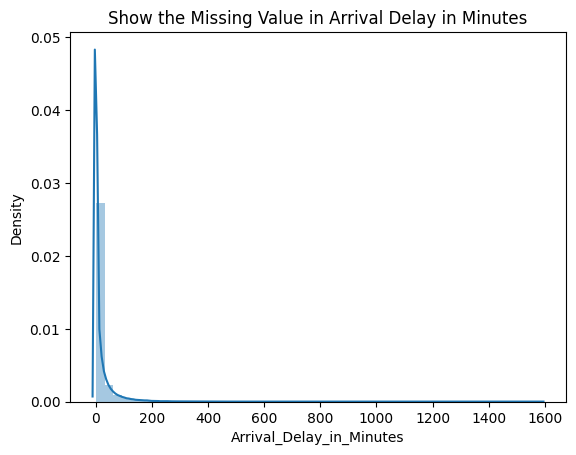

In [14]:
plt.title('Show the Missing Value in Arrival Delay in Minutes')
sns.distplot(df['Arrival_Delay_in_Minutes']); 

In [15]:
df['Arrival_Delay_in_Minutes'].fillna(df['Arrival_Delay_in_Minutes'].mean(),inplace=True)

In [16]:
df.isna().sum()

satisfaction                         0
Gender                               0
Customer_Type                        0
Age                                  0
Type_of_Travel                       0
Class                                0
Flight_Distance                      0
Seat_comfort                         0
Departure/Arrival_time_convenient    0
Food_and_drink                       0
Gate_location                        0
Inflight_wifi_service                0
Inflight_entertainment               0
Online_support                       0
Ease_of_Online_booking               0
On-board_service                     0
Leg_room_service                     0
Baggage_handling                     0
Checkin_service                      0
Cleanliness                          0
Online_boarding                      0
Departure_Delay_in_Minutes           0
Arrival_Delay_in_Minutes             0
dtype: int64

## Univariate Analysis

In [17]:
px.histogram( df, x = 'Flight_Distance',color = 'satisfaction',title='<b>Distrbution of Flight Distance')

<Axes: title={'center': 'Distrbution of Age'}, xlabel='Age', ylabel='Density'>

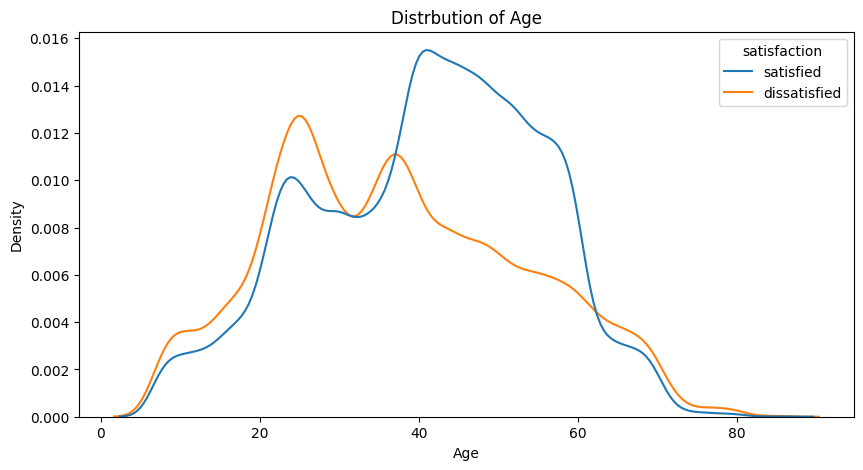

In [18]:
plt.figure(figsize=[10,5])
plt.title('Distrbution of Age')
sns.kdeplot(data = df, x = 'Age',hue = 'satisfaction')

<Axes: title={'center': 'Heatmap'}>

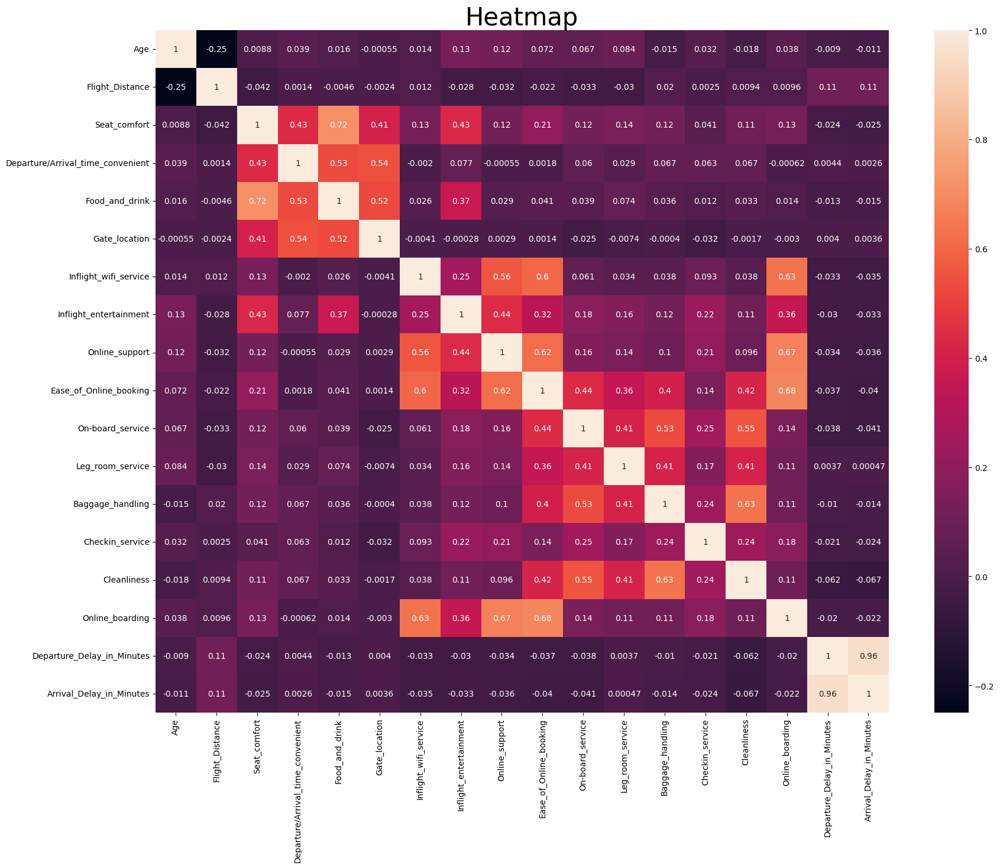

In [19]:
plt.figure(figsize=[20,15])
plt.title('Heatmap' , fontsize = 30)
sns.heatmap(df.corr() , annot= True)

In [20]:
px.sunburst(df,path=["satisfaction"],template="plotly_white",title="<b>Ratio of Satisfaction")

# Analysis Question

In [21]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 129880 entries, 0 to 129879
Data columns (total 23 columns):
 #   Column                             Non-Null Count   Dtype  
---  ------                             --------------   -----  
 0   satisfaction                       129880 non-null  object 
 1   Gender                             129880 non-null  object 
 2   Customer_Type                      129880 non-null  object 
 3   Age                                129880 non-null  int64  
 4   Type_of_Travel                     129880 non-null  object 
 5   Class                              129880 non-null  object 
 6   Flight_Distance                    129880 non-null  float64
 7   Seat_comfort                       129880 non-null  int64  
 8   Departure/Arrival_time_convenient  129880 non-null  int64  
 9   Food_and_drink                     129880 non-null  int64  
 10  Gate_location                      129880 non-null  int64  
 11  Inflight_wifi_service              1298

### 1) What is Description numbers of Flight Distance Compared of Satisfaction ?

In [22]:
s_FD = df.groupby(['satisfaction'])['Flight_Distance'].describe()
s_FD

,count,mean,std,min,25%,50%,75%,max
satisfaction,,,,,,,,
dissatisfied,58793.0,2025.709234,888.148947,50.0,1520.0,1955.0,2462.0,6951.0
satisfied,71087.0,1944.770281,1127.893115,50.0,1070.0,1886.0,2627.0,6950.0


<Axes: >

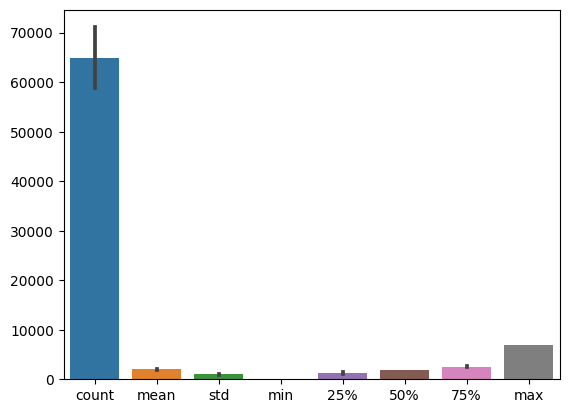

In [23]:
sns.barplot(data = s_FD)

### 2) What is numbers of each Gender reserve each type of Class are Satisfied  ?

In [24]:
df.groupby(['satisfaction','Gender','Class'])[['Gender']].count()

Gender
satisfaction Gender Class           
dissatisfied Female Business    8734
                    Eco        12141
                    Eco Plus    2096
             Male   Business    9331
                    Eco        23195
                    Eco Plus    3296
satisfied    Female Business   22529
                    Eco        17529
                    Eco Plus    2870
             Male   Business   21566
                    Eco         5444
                    Eco Plus    1149

In [25]:
px.sunburst(df,path=['satisfaction','Gender','Class'],template="plotly_white",title="<b>Numbers of each Gender reserve each type of Class are Satisfied")

### 3) What is the Avg. Age reserve each type of Class and there Satisfiction?

In [26]:
df.groupby(['satisfaction','Class'])['Age'].median()[1]

35.0

### 4) What Customer Type are with each Class is Satisfied ?

In [27]:
px.sunburst(df,path=['satisfaction','Customer_Type','Class'],template="plotly_white",title="<b>Customer Type are with each Class is Satisfied")

### 5) What number of each Gender is on each Customer Type are Satisfied ?

In [28]:
df.groupby(['satisfaction','Gender', 'Customer_Type'])[['Gender']].count()

Gender
satisfaction Gender Customer_Type            
dissatisfied Female Loyal Customer      13078
                    disloyal Customer    9893
             Male   Loyal Customer      27635
                    disloyal Customer    8187
satisfied    Female Loyal Customer      39978
                    disloyal Customer    2950
             Male   Loyal Customer      25409
                    disloyal Customer    2750

### 6) What is the Type Of Travel numbers with each Customer Type and there Satisfaction?

In [29]:
df.groupby(['satisfaction','Type_of_Travel','Customer_Type'])[['Type_of_Travel']].count()

Type_of_Travel
satisfaction Type_of_Travel  Customer_Type                    
dissatisfied Business travel Loyal Customer              19426
                             disloyal Customer           17911
             Personal Travel Loyal Customer              21287
                             disloyal Customer             169
satisfied    Business travel Loyal Customer              46688
                             disloyal Customer            5668
             Personal Travel Loyal Customer              18699
                             disloyal Customer              32

### 7) What is the Avg. Age is counted as Loyal Customer?

In [30]:
df.groupby(['Customer_Type'])['Age'].median()[1]

27.0

In [31]:
px.violin(df,y="Age",x="Customer_Type",color="satisfaction",title="<b>Age vs Customer Type vs satisfaction")

### 8) What is the Avg. Age is counted as disLoyal Customer?

In [32]:
df.groupby(['Customer_Type'])['Age'].median()[0]

43.0

### 9) What is number of each Gender are Satisfied with Type of Travel ?

In [33]:
df.groupby(['satisfaction','Type_of_Travel','Gender'])[['Gender']].count()

Gender
satisfaction Type_of_Travel  Gender        
dissatisfied Business travel Female   19571
                             Male     17766
             Personal Travel Female    3400
                             Male     18056
satisfied    Business travel Female   26223
                             Male     26133
             Personal Travel Female   16705
                             Male      2026

### 10) What Age is Satisfied with each Type of Travel ?

In [34]:
df.groupby(['satisfaction','Type_of_Travel'])['Age'].median()[1]

39.0

### 11) Which Gender by Age is Most Satisfied ?

In [35]:
df.groupby(['satisfaction','Gender'])['Age'].median()[1]

37.0

### 12) How much Customer Types are Satisfied ?

In [36]:
px.sunburst(df,path=["Customer_Type","satisfaction"],template="plotly",title="<b>Ratio Customer Types are Satisfied ")

### 12) What is the Ratio of Classes Types are Satisfied ?

In [37]:
px.sunburst(df,path=["Class","satisfaction"],template="plotly_white",title="<b>Ratio of Classes Types are Satisfied")

# Handle Outliers


<Axes: >

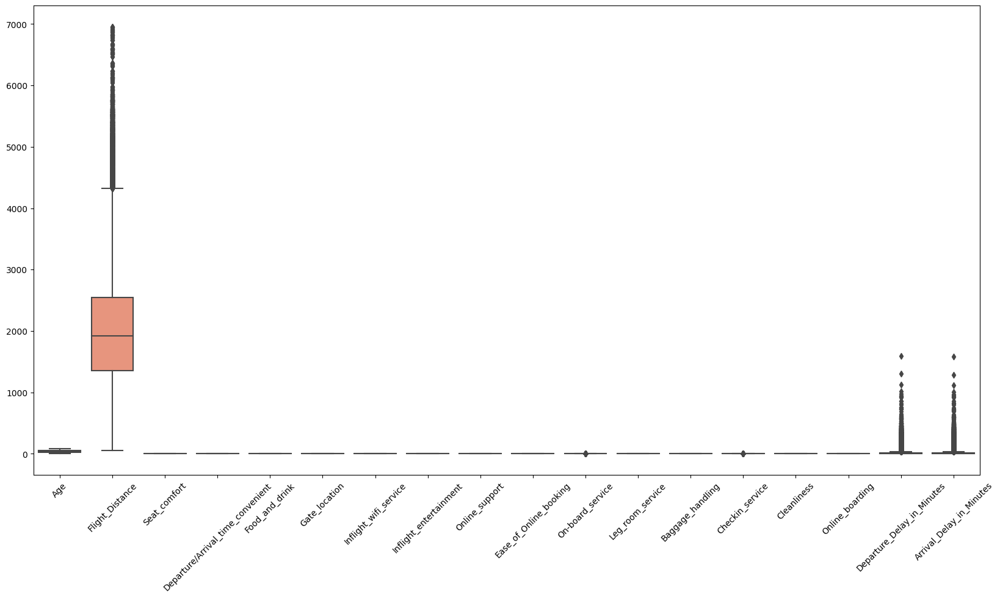

In [38]:
plt.figure(figsize=[20,10])
plt.xticks(rotation = 45)
sns.boxplot(data = df)

In [39]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 129880 entries, 0 to 129879
Data columns (total 23 columns):
 #   Column                             Non-Null Count   Dtype  
---  ------                             --------------   -----  
 0   satisfaction                       129880 non-null  object 
 1   Gender                             129880 non-null  object 
 2   Customer_Type                      129880 non-null  object 
 3   Age                                129880 non-null  int64  
 4   Type_of_Travel                     129880 non-null  object 
 5   Class                              129880 non-null  object 
 6   Flight_Distance                    129880 non-null  float64
 7   Seat_comfort                       129880 non-null  int64  
 8   Departure/Arrival_time_convenient  129880 non-null  int64  
 9   Food_and_drink                     129880 non-null  int64  
 10  Gate_location                      129880 non-null  int64  
 11  Inflight_wifi_service              1298

In [40]:
df.columns

Index(['satisfaction', 'Gender', 'Customer_Type', 'Age', 'Type_of_Travel',
       'Class', 'Flight_Distance', 'Seat_comfort',
       'Departure/Arrival_time_convenient', 'Food_and_drink', 'Gate_location',
       'Inflight_wifi_service', 'Inflight_entertainment', 'Online_support',
       'Ease_of_Online_booking', 'On-board_service', 'Leg_room_service',
       'Baggage_handling', 'Checkin_service', 'Cleanliness', 'Online_boarding',
       'Departure_Delay_in_Minutes', 'Arrival_Delay_in_Minutes'],
      dtype='object')

In [41]:
index = detect_outliers(df , 0 , ['Flight_Distance' ,'Departure_Delay_in_Minutes' , 'Arrival_Delay_in_Minutes' , 'On-board_service','Checkin_service'])
len(index)

43411

In [42]:
df.shape

(129880, 23)

In [43]:
df.drop(index , inplace=True)

# Saving data in new cleaned one

In [44]:
satisfactions_of_Airlines = df.to_csv('Satisfactions_of_Airlines.csv', index= False)

In [45]:
df_new = pd.read_csv('Satisfactions_of_Airlines.csv')

In [46]:
df_new['Type_of_Travel'].unique()

array(['Personal Travel', 'Business travel'], dtype=object)

In [47]:
df_new.head()

,satisfaction,Gender,Customer_Type,Age,Type_of_Travel,Class,Flight_Distance,Seat_comfort,Departure/Arrival_time_convenient,Food_and_drink,...,Online_support,Ease_of_Online_booking,On-board_service,Leg_room_service,Baggage_handling,Checkin_service,Cleanliness,Online_boarding,Departure_Delay_in_Minutes,Arrival_Delay_in_Minutes
0,satisfied,Female,Loyal Customer,65,Personal Travel,Eco,265.0,0,0,0,...,2,3,3,0,3,5,3,2,0.0,0.0
1,satisfied,Female,Loyal Customer,15,Personal Travel,Eco,2138.0,0,0,0,...,2,2,3,3,4,4,4,2,0.0,0.0
2,satisfied,Female,Loyal Customer,70,Personal Travel,Eco,354.0,0,0,0,...,4,2,2,0,2,4,2,5,0.0,0.0
3,satisfied,Male,Loyal Customer,30,Personal Travel,Eco,1894.0,0,0,0,...,2,2,5,4,5,5,4,2,0.0,0.0
4,satisfied,Female,Loyal Customer,66,Personal Travel,Eco,227.0,0,0,0,...,5,5,5,0,5,5,5,3,17.0,15.0


In [48]:
df_new.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 86469 entries, 0 to 86468
Data columns (total 23 columns):
 #   Column                             Non-Null Count  Dtype  
---  ------                             --------------  -----  
 0   satisfaction                       86469 non-null  object 
 1   Gender                             86469 non-null  object 
 2   Customer_Type                      86469 non-null  object 
 3   Age                                86469 non-null  int64  
 4   Type_of_Travel                     86469 non-null  object 
 5   Class                              86469 non-null  object 
 6   Flight_Distance                    86469 non-null  float64
 7   Seat_comfort                       86469 non-null  int64  
 8   Departure/Arrival_time_convenient  86469 non-null  int64  
 9   Food_and_drink                     86469 non-null  int64  
 10  Gate_location                      86469 non-null  int64  
 11  Inflight_wifi_service              86469 non-null  int

# Split data into Input and Output

In [49]:
X = df.drop('satisfaction' , axis=1)
y = df['satisfaction']

# Dealing with categorical data or Mapping


In [50]:
X

,Gender,Customer_Type,Age,Type_of_Travel,Class,Flight_Distance,Seat_comfort,Departure/Arrival_time_convenient,Food_and_drink,Gate_location,...,Online_support,Ease_of_Online_booking,On-board_service,Leg_room_service,Baggage_handling,Checkin_service,Cleanliness,Online_boarding,Departure_Delay_in_Minutes,Arrival_Delay_in_Minutes
0,Female,Loyal Customer,65,Personal Travel,Eco,265.0,0,0,0,2,...,2,3,3,0,3,5,3,2,0.0,0.000000
2,Female,Loyal Customer,15,Personal Travel,Eco,2138.0,0,0,0,3,...,2,2,3,3,4,4,4,2,0.0,0.000000
4,Female,Loyal Customer,70,Personal Travel,Eco,354.0,0,0,0,3,...,4,2,2,0,2,4,2,5,0.0,0.000000
5,Male,Loyal Customer,30,Personal Travel,Eco,1894.0,0,0,0,3,...,2,2,5,4,5,5,4,2,0.0,0.000000
6,Female,Loyal Customer,66,Personal Travel,Eco,227.0,0,0,0,3,...,5,5,5,0,5,5,5,3,17.0,15.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
129871,Female,disloyal Customer,35,Personal Travel,Eco,3287.0,5,4,5,3,...,2,2,4,5,4,4,3,2,9.0,0.000000
129872,Female,disloyal Customer,69,Personal Travel,Eco,2240.0,5,4,5,3,...,4,4,5,4,4,3,4,4,4.0,0.000000
129873,Female,disloyal Customer,63,Personal Travel,Eco,1942.0,5,5,4,4,...,3,3,5,2,5,3,5,3,7.0,15.091129
129874,Female,disloyal Customer,11,Personal Travel,Eco,2752.0,5,5,5,2,...,2,2,3,5,3,5,4,2,5.0,0.000000


In [51]:
X = pd.get_dummies(X , drop_first= True)

In [52]:
X

,Age,Flight_Distance,Seat_comfort,Departure/Arrival_time_convenient,Food_and_drink,Gate_location,Inflight_wifi_service,Inflight_entertainment,Online_support,Ease_of_Online_booking,...,Checkin_service,Cleanliness,Online_boarding,Departure_Delay_in_Minutes,Arrival_Delay_in_Minutes,Gender_Male,Customer_Type_disloyal Customer,Type_of_Travel_Personal Travel,Class_Eco,Class_Eco Plus
0,65,265.0,0,0,0,2,2,4,2,3,...,5,3,2,0.0,0.000000,0,0,1,1,0
2,15,2138.0,0,0,0,3,2,0,2,2,...,4,4,2,0.0,0.000000,0,0,1,1,0
4,70,354.0,0,0,0,3,4,3,4,2,...,4,2,5,0.0,0.000000,0,0,1,1,0
5,30,1894.0,0,0,0,3,2,0,2,2,...,5,4,2,0.0,0.000000,1,0,1,1,0
6,66,227.0,0,0,0,3,2,5,5,5,...,5,5,3,17.0,15.000000,0,0,1,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
129871,35,3287.0,5,4,5,3,2,5,2,2,...,4,3,2,9.0,0.000000,0,1,1,1,0
129872,69,2240.0,5,4,5,3,4,5,4,4,...,3,4,4,4.0,0.000000,0,1,1,1,0
129873,63,1942.0,5,5,4,4,3,4,3,3,...,3,5,3,7.0,15.091129,0,1,1,1,0
129874,11,2752.0,5,5,5,2,2,5,2,2,...,5,4,2,5.0,0.000000,0,1,1,1,0


In [53]:
y

0         satisfied
2         satisfied
4         satisfied
5         satisfied
6         satisfied
            ...    
129871    satisfied
129872    satisfied
129873    satisfied
129874    satisfied
129875    satisfied
Name: satisfaction, Length: 86469, dtype: object

In [54]:
y = pd.get_dummies(y , drop_first= True)

In [55]:
y

,satisfied
0,1
2,1
4,1
5,1
6,1
...,...
129871,1
129872,1
129873,1
129874,1


--------------------------

In [56]:
satisfaction_mapping = {"satisfied": 1, "dissatisfied": 0}
df['satisfaction'] = df['satisfaction'].map(satisfaction_mapping) 
  
gender_mapping = {"Female": 1, "Male": 0}
df['Gender'] = df['Gender'].map(gender_mapping) 
  
customer_type_mapping = {"Loyal Customer": 1, "disloyal Customer": 0}
df['Customer_Type'] = df['Customer_Type'].map(customer_type_mapping) 
 
travel_type_mapping = {"Business travel": 2, "Personal Travel": 1}
df['Type_of_Travel'] = df['Type_of_Travel'].map(travel_type_mapping)  
 
class_mapping = {"Business": 3, "Eco Plus": 2, "Eco": 1}
df['Class'] = df['Class'].map(class_mapping)

# Split data into Train and Test


In [57]:
x_train , x_test , y_train , y_test = train_test_split(X , y , test_size=0.2 , random_state= 42 , stratify= y)

In [58]:
x_train

,Age,Flight_Distance,Seat_comfort,Departure/Arrival_time_convenient,Food_and_drink,Gate_location,Inflight_wifi_service,Inflight_entertainment,Online_support,Ease_of_Online_booking,...,Checkin_service,Cleanliness,Online_boarding,Departure_Delay_in_Minutes,Arrival_Delay_in_Minutes,Gender_Male,Customer_Type_disloyal Customer,Type_of_Travel_Personal Travel,Class_Eco,Class_Eco Plus
87924,58,401.0,2,2,2,2,2,4,4,3,...,3,3,5,0.0,0.0,0,0,0,0,0
125415,48,2725.0,1,1,1,1,3,5,4,5,...,4,5,3,0.0,0.0,0,0,0,0,0
110921,56,3149.0,4,4,3,4,3,5,4,5,...,4,5,3,0.0,2.0,1,0,0,0,0
65584,52,222.0,0,5,0,3,5,4,5,3,...,4,3,4,0.0,0.0,1,0,0,0,0
122164,33,809.0,5,5,5,5,3,5,5,5,...,2,5,2,0.0,0.0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
59992,23,3607.0,4,4,4,4,3,4,3,3,...,3,4,3,24.0,28.0,1,1,0,1,0
90806,36,826.0,2,2,2,2,3,5,4,4,...,5,4,3,8.0,11.0,1,0,0,0,0
75571,54,803.0,2,5,4,5,2,4,4,2,...,4,2,3,0.0,0.0,0,0,0,1,0
98911,41,924.0,2,2,2,2,3,5,4,4,...,4,4,4,14.0,0.0,1,0,0,0,0


In [59]:
x_test

,Age,Flight_Distance,Seat_comfort,Departure/Arrival_time_convenient,Food_and_drink,Gate_location,Inflight_wifi_service,Inflight_entertainment,Online_support,Ease_of_Online_booking,...,Checkin_service,Cleanliness,Online_boarding,Departure_Delay_in_Minutes,Arrival_Delay_in_Minutes,Gender_Male,Customer_Type_disloyal Customer,Type_of_Travel_Personal Travel,Class_Eco,Class_Eco Plus
28107,13,2690.0,5,3,3,3,4,3,4,5,...,3,5,2,9.0,12.0,0,0,1,1,0
96366,52,1698.0,1,1,1,1,2,4,4,4,...,3,4,3,20.0,13.0,0,0,0,0,0
53184,48,4194.0,3,3,3,3,3,2,2,3,...,2,1,2,0.0,0.0,0,1,0,1,0
32614,52,881.0,4,1,4,4,3,3,3,4,...,3,4,4,0.0,0.0,0,0,1,0,0
115065,25,1889.0,2,2,2,2,5,5,5,5,...,3,5,5,0.0,0.0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
93297,47,1585.0,5,5,5,5,5,4,4,4,...,4,4,4,0.0,0.0,0,0,0,0,0
36852,27,937.0,4,5,4,1,3,4,3,3,...,5,4,3,0.0,0.0,0,0,1,1,0
87164,77,1836.0,4,1,1,1,3,3,4,4,...,2,4,2,0.0,0.0,1,0,0,0,0
16592,51,2526.0,2,5,2,1,1,2,1,1,...,4,5,1,27.0,4.0,1,0,1,1,0


In [60]:
y_train

,satisfied
87924,1
125415,1
110921,1
65584,1
122164,1
...,...
59992,1
90806,1
75571,0
98911,1


In [61]:
y_test

,satisfied
28107,1
96366,1
53184,0
32614,0
115065,1
...,...
93297,1
36852,0
87164,0
16592,0


# Scaling

In [62]:
sc = StandardScaler()

x_train_sc = sc.fit_transform(x_train)
x_test_sc = sc.transform(x_test)

In [63]:
x_train_sc = pd.DataFrame(x_train_sc , columns= sc.get_feature_names_out())
x_train_sc

,Age,Flight_Distance,Seat_comfort,Departure/Arrival_time_convenient,Food_and_drink,Gate_location,Inflight_wifi_service,Inflight_entertainment,Online_support,Ease_of_Online_booking,...,Checkin_service,Cleanliness,Online_boarding,Departure_Delay_in_Minutes,Arrival_Delay_in_Minutes,Gender_Male,Customer_Type_disloyal Customer,Type_of_Travel_Personal Travel,Class_Eco,Class_Eco Plus
0,1.199678,-1.569380,-0.633106,-0.674398,-0.601065,-0.731853,-0.997783,0.368351,0.288665,-0.494976,...,-0.726880,-0.873016,1.223505,-0.513299,-0.518135,-0.969767,-0.461451,-0.689917,-0.854997,-0.26104
1,0.533228,0.855157,-1.343006,-1.324286,-1.290790,-1.486845,-0.230253,1.115608,0.288665,1.116544,...,0.302433,1.047020,-0.346415,-0.513299,-0.518135,-0.969767,-0.461451,-0.689917,-0.854997,-0.26104
2,1.066388,1.297499,0.786693,0.625376,0.088660,0.778130,-0.230253,1.115608,0.288665,1.116544,...,0.302433,1.047020,-0.346415,-0.513299,-0.220853,1.031176,-0.461451,-0.689917,-0.854997,-0.26104
3,0.799808,-1.756124,-2.052906,1.275263,-1.980515,0.023138,1.304806,0.368351,1.063807,-0.494976,...,0.302433,-0.873016,0.438545,-0.513299,-0.518135,1.031176,-0.461451,-0.689917,-0.854997,-0.26104
4,-0.466447,-1.143730,1.496593,1.275263,1.468110,1.533121,-0.230253,1.115608,1.063807,1.116544,...,-1.756194,1.047020,-1.131375,-0.513299,-0.518135,-0.969767,-0.461451,-0.689917,-0.854997,-0.26104
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
69170,-1.132897,1.775312,0.786693,0.625376,0.778385,0.778130,-0.230253,0.368351,-0.486477,-0.494976,...,-0.726880,0.087002,-0.346415,3.058369,3.643806,1.031176,2.167078,-0.689917,1.169595,-0.26104
69171,-0.266512,-1.125994,-0.633106,-0.674398,-0.601065,-0.731853,-0.230253,1.115608,0.288665,0.310784,...,1.331746,0.087002,-0.346415,0.677257,1.116913,1.031176,-0.461451,-0.689917,-0.854997,-0.26104
69172,0.933098,-1.149989,-0.633106,1.275263,0.778385,1.533121,-0.997783,0.368351,0.288665,-1.300737,...,0.302433,-1.833034,-0.346415,-0.513299,-0.518135,-0.969767,-0.461451,-0.689917,1.169595,-0.26104
69173,0.066713,-1.023755,-0.633106,-0.674398,-0.601065,-0.731853,-0.230253,1.115608,0.288665,0.310784,...,0.302433,0.087002,0.438545,1.570174,-0.518135,1.031176,-0.461451,-0.689917,-0.854997,-0.26104


In [64]:
x_test_sc = pd.DataFrame(x_test_sc , columns= sc.get_feature_names_out())
x_test_sc

,Age,Flight_Distance,Seat_comfort,Departure/Arrival_time_convenient,Food_and_drink,Gate_location,Inflight_wifi_service,Inflight_entertainment,Online_support,Ease_of_Online_booking,...,Checkin_service,Cleanliness,Online_boarding,Departure_Delay_in_Minutes,Arrival_Delay_in_Minutes,Gender_Male,Customer_Type_disloyal Customer,Type_of_Travel_Personal Travel,Class_Eco,Class_Eco Plus
0,-1.799346,0.818642,1.496593,-0.024511,0.088660,0.023138,0.537276,-0.378905,0.288665,1.116544,...,-0.726880,1.047020,-1.131375,0.826077,1.265554,-0.969767,-0.461451,1.449450,1.169595,-0.26104
1,0.799808,-0.216272,-1.343006,-1.324286,-1.290790,-1.486845,-0.997783,0.368351,0.288665,0.310784,...,-0.726880,0.087002,-0.346415,2.463091,1.414195,-0.969767,-0.461451,-0.689917,-0.854997,-0.26104
2,0.533228,2.387706,0.076793,-0.024511,0.088660,0.023138,-0.230253,-1.126162,-1.261618,-0.494976,...,-1.756194,-2.793052,-1.131375,-0.513299,-0.518135,-0.969767,2.167078,-0.689917,1.169595,-0.26104
3,0.799808,-1.068615,0.786693,-1.324286,0.778385,0.778130,-0.230253,-0.378905,-0.486477,0.310784,...,-0.726880,0.087002,0.438545,-0.513299,-0.518135,-0.969767,-0.461451,1.449450,-0.854997,-0.26104
4,-0.999607,-0.017009,-0.633106,-0.674398,-0.601065,-0.731853,1.304806,1.115608,1.063807,1.116544,...,-0.726880,1.047020,1.223505,-0.513299,-0.518135,-0.969767,-0.461451,-0.689917,-0.854997,-0.26104
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
17289,0.466583,-0.334160,1.496593,1.275263,1.468110,1.533121,1.304806,0.368351,0.288665,0.310784,...,0.302433,0.087002,0.438545,-0.513299,-0.518135,-0.969767,-0.461451,-0.689917,-0.854997,-0.26104
17290,-0.866317,-1.010193,0.786693,1.275263,0.778385,-1.486845,-0.230253,0.368351,-0.486477,-0.494976,...,1.331746,0.087002,-0.346415,-0.513299,-0.518135,-0.969767,-0.461451,1.449450,1.169595,-0.26104
17291,2.465933,-0.072302,0.786693,-1.324286,-1.290790,-1.486845,-0.230253,-0.378905,0.288665,0.310784,...,-1.756194,0.087002,-1.131375,-0.513299,-0.518135,1.031176,-0.461451,-0.689917,-0.854997,-0.26104
17292,0.733163,0.647548,-0.633106,1.275263,-0.601065,-1.486845,-1.765313,-1.126162,-2.036760,-2.106497,...,0.302433,1.047020,-1.916335,3.504827,0.076428,1.031176,-0.461451,1.449450,1.169595,-0.26104


# Handle Imbalance Data

Counts of each class
satisfied
1            53531
0            32938
dtype: int64


(86469, 1)

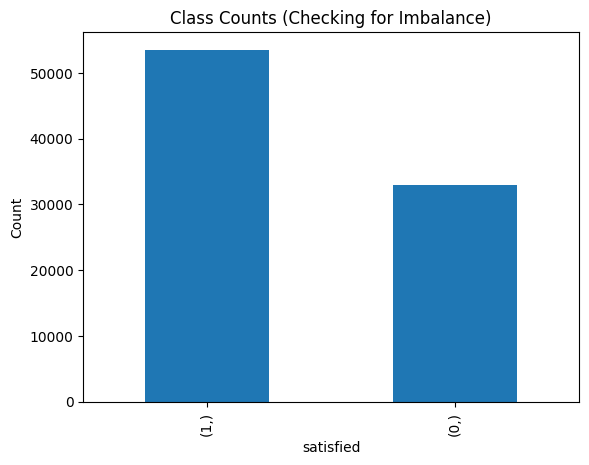

In [65]:
print("Counts of each class")
print(y.value_counts())
y.value_counts().plot(kind='bar')
plt.ylabel('Count')
plt.title('Class Counts (Checking for Imbalance)')
y.shape

In [66]:
sm = SMOTE()

x_train_sm , y_train_sm = sm.fit_resample(x_train_sc , y_train)

In [67]:
x_train_sm

,Age,Flight_Distance,Seat_comfort,Departure/Arrival_time_convenient,Food_and_drink,Gate_location,Inflight_wifi_service,Inflight_entertainment,Online_support,Ease_of_Online_booking,...,Checkin_service,Cleanliness,Online_boarding,Departure_Delay_in_Minutes,Arrival_Delay_in_Minutes,Gender_Male,Customer_Type_disloyal Customer,Type_of_Travel_Personal Travel,Class_Eco,Class_Eco Plus
0,1.199678,-1.569380,-0.633106,-0.674398,-0.601065,-0.731853,-0.997783,0.368351,0.288665,-0.494976,...,-0.726880,-0.873016,1.223505,-0.513299,-0.518135,-0.969767,-0.461451,-0.689917,-0.854997,-0.26104
1,0.533228,0.855157,-1.343006,-1.324286,-1.290790,-1.486845,-0.230253,1.115608,0.288665,1.116544,...,0.302433,1.047020,-0.346415,-0.513299,-0.518135,-0.969767,-0.461451,-0.689917,-0.854997,-0.26104
2,1.066388,1.297499,0.786693,0.625376,0.088660,0.778130,-0.230253,1.115608,0.288665,1.116544,...,0.302433,1.047020,-0.346415,-0.513299,-0.220853,1.031176,-0.461451,-0.689917,-0.854997,-0.26104
3,0.799808,-1.756124,-2.052906,1.275263,-1.980515,0.023138,1.304806,0.368351,1.063807,-0.494976,...,0.302433,-0.873016,0.438545,-0.513299,-0.518135,1.031176,-0.461451,-0.689917,-0.854997,-0.26104
4,-0.466447,-1.143730,1.496593,1.275263,1.468110,1.533121,-0.230253,1.115608,1.063807,1.116544,...,-1.756194,1.047020,-1.131375,-0.513299,-0.518135,-0.969767,-0.461451,-0.689917,-0.854997,-0.26104
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
85645,-0.472966,1.297136,0.076793,-1.303094,0.066169,-0.001481,0.512248,-0.378905,0.263389,-0.494976,...,-0.726880,-0.873016,-0.346415,3.499974,3.500013,-0.969767,-0.461451,-0.689917,-0.854997,-0.26104
85646,-1.311679,0.127918,-0.858427,-1.086944,-0.819982,0.023138,1.304806,-1.363340,1.063807,1.116544,...,-0.726880,0.742312,1.223505,-0.012491,2.556143,-0.969767,2.167078,-0.689917,1.169595,-0.26104
85647,-1.354406,-0.501492,-0.503159,-0.674398,-0.193075,0.778130,-0.997783,-0.684141,0.605291,-1.300737,...,-1.335745,-0.305141,-1.131375,-0.161177,1.414195,-0.969767,2.167078,-0.689917,1.169595,-0.26104
85648,-1.957558,0.934319,-0.825496,1.275263,-0.787987,0.023138,1.304806,-1.328676,1.063807,1.116544,...,-0.726880,1.047020,1.223505,-0.404811,-0.518135,1.031176,-0.461451,1.449450,1.169595,-0.26104


In [68]:
y_train_sm

,satisfied
0,1
1,1
2,1
3,1
4,1
...,...
85645,0
85646,0
85647,0
85648,0


Counts of each class
satisfied
0            42825
1            42825
dtype: int64


(85650, 1)

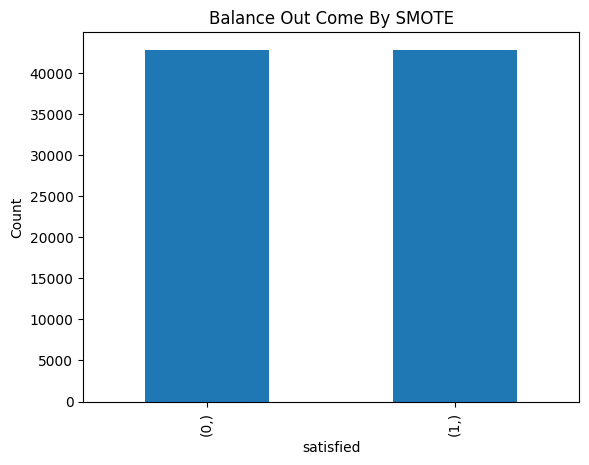

In [69]:
print("Counts of each class")
print(y_train_sm.value_counts())
y_train_sm.value_counts().plot(kind='bar')
plt.ylabel('Count')
plt.title('Balance Out Come By SMOTE')
y_train_sm.shape

--------------------

# DashBoard

In [72]:
%%writefile Satisfactions_of_Airlines.py
import streamlit as st
import pandas as pd
import plotly.express as px
import seaborn as sns

st.set_page_config(layout='wide', page_title = 'Satisfactions of Airlines')


def main_page():
    st.title('Describe The Satisfactions of Airlines data')
    st.image('large-aircraft-is-flying-sky-sunset_674594-28746.jpg')
    
    df = pd.read_csv('Invistico_Airline.csv')
    describe = df.describe()
    
    st.subheader('Descriptive Statistics')
    st.dataframe(describe,use_container_width=True)
    
    df_new = pd.read_csv('Satisfactions_of_Airlines.csv')
 
    def check(df):
        l=[]
        columns=df.columns
        for col in columns:
            dtypes=df[col].dtypes
            nunique=df[col].nunique()
            sum_null=df[col].isnull().sum()
            l.append([col,dtypes,nunique,sum_null])
        df_check=pd.DataFrame(l)
        df_check.columns=['column','dtypes','nunique','sum_null']
        return df_check 
    
    st.subheader('Data Before EDA Info')
    st.dataframe(check(df),use_container_width=True)
       
    st.subheader('Present Data Info')
    st.dataframe(check(df_new),use_container_width=True)

def analysis_page():
    
    st.title('Satisfactions of Airlines Overview')
    st.image('gettyimages-1714902515-1024x1024.jpg', width=600 )
    df_new = pd.read_csv('Satisfactions_of_Airlines.csv')
    
    Class = st.sidebar.selectbox('Select type of Class', df_new['Class'].unique())
    Customer_Type = st.sidebar.selectbox('Select type of Customer', df_new['Customer_Type'].unique())
    Type_of_Travel = st.sidebar.selectbox('Select type of Travel', df_new['Type_of_Travel'].unique())
    Gender = st.sidebar.selectbox('Select type of Gender' , df_new['Gender'].unique())
    
    col1, col2  = st.columns(2)
    
    with col1:
    
        g_c_s = df_new[df_new['Gender']==Gender ]
        fig1 = px.histogram(g_c_s , x='Gender',facet_col="Class" ,text_auto=True, color="satisfaction",barmode='group',color_discrete_sequence=px.colors.qualitative.G10,\
        title=f'Type of Class on each {Gender} and there Satisfaction'.title()).update_layout(paper_bgcolor = "rgba(0,0,0,0)",plot_bgcolor = "rgba(0,0,0,0)")                        
        st.plotly_chart(fig1 ,use_container_width=True)
        
        c_ct_s = df_new[df_new['Class']== Class]
        fig2 = px.histogram(c_ct_s , x='Class',facet_col="Customer_Type" ,text_auto=True, color="satisfaction",barmode='group',color_discrete_sequence=px.colors.qualitative.G10,\
        title=f'Type of Customer on each {Class} and there Satisfaction'.title()).update_layout(paper_bgcolor = "rgba(0,0,0,0)",plot_bgcolor = "rgba(0,0,0,0)")                        
        st.plotly_chart(fig2 ,use_container_width=True)
        
        ct_tot_s = df_new[df_new['Customer_Type']== Customer_Type]
        fig3 = px.histogram(ct_tot_s , x='Customer_Type',facet_col="Type_of_Travel" ,text_auto=True, color="satisfaction",barmode='group',color_discrete_sequence=px.colors.qualitative.G10,\
        title=f'Type of Travel Type on each {Customer_Type} and there Satisfaction'.title()).update_layout(paper_bgcolor = "rgba(0,0,0,0)",plot_bgcolor = "rgba(0,0,0,0)")                        
        st.plotly_chart(fig3 ,use_container_width=True)
        
        tot_g_s = df_new[df_new['Type_of_Travel']== Type_of_Travel]
        fig4 = px.histogram(tot_g_s , x='Type_of_Travel',facet_col="Gender" ,text_auto=True, color="satisfaction",barmode='group',color_discrete_sequence=px.colors.qualitative.G10,\
        title=f'Type of Gender on each {Type_of_Travel} and there Satisfaction'.title()).update_layout(paper_bgcolor = "rgba(0,0,0,0)",plot_bgcolor = "rgba(0,0,0,0)")                        
        st.plotly_chart(fig4 ,use_container_width=True)
        
        g_ct_s = df_new[df_new['Gender']== Gender]
        fig5 = px.histogram(g_ct_s , x='Gender',facet_col="Customer_Type",text_auto=True ,color="satisfaction",barmode='group',color_discrete_sequence=px.colors.qualitative.G10,\
        title=f'Customer Type on each {Gender} and there Satisfaction'.title()).update_layout(paper_bgcolor = "rgba(0,0,0,0)",plot_bgcolor = "rgba(0,0,0,0)")                        
        st.plotly_chart(fig5 ,use_container_width=True)
        
        c_tot_s = df_new[df_new['Class']== Class]
        fig6 = px.histogram(c_tot_s , x='Class',facet_col="Type_of_Travel",text_auto=True ,color="satisfaction",barmode='group',color_discrete_sequence=px.colors.qualitative.G10,\
        title=f'Type of Travel on each {Class} and there Satisfaction'.title()).update_layout(paper_bgcolor = "rgba(0,0,0,0)",plot_bgcolor = "rgba(0,0,0,0)")                        
        st.plotly_chart(fig6 ,use_container_width=True)
        
    with col2:
        
        fig1 = px.sunburst(df_new,path=['satisfaction','Gender','Class'],template="plotly_white",title="<b>Ratio of each Gender reserve each type of Class are Satisfied")
        st.plotly_chart(fig1 ,use_container_width=True)
         
        fig2 = px.sunburst(df_new,path=['satisfaction','Class','Customer_Type'],template="plotly_white",title="<b>Ratio of each Type of Classes on each Customer Type and there Satisfied")
        st.plotly_chart(fig2 ,use_container_width=True)

        fig3 = px.sunburst(df_new,path=['satisfaction','Customer_Type','Type_of_Travel'],template="plotly_white",title="<b>Ratio of each Type of Customer on each type of Travel are Satisfied")
        st.plotly_chart(fig3 ,use_container_width=True)
       
        fig4 = px.sunburst(df_new,path=['satisfaction','Type_of_Travel','Gender'],template="plotly_white",title="<b>Ratio of each Type of Travel on each type of Gender are Satisfied")
        st.plotly_chart(fig4 ,use_container_width=True)
                
        fig5 = px.sunburst(df_new,path=['satisfaction','Gender','Customer_Type'],template="plotly_white",title="<b>Ratio of Customer Type on each type of Gender are Satisfied")
        st.plotly_chart(fig5 ,use_container_width=True)
        
        fig6 = px.sunburst(df_new,path=['satisfaction','Class','Type_of_Travel'],template="plotly_white",title="<b>Ratio of Type of Travel on each Type of Class are Satisfied")
        st.plotly_chart(fig6 ,use_container_width=True)
        
    
def general_distribute_page():

    st.title('Genaeral Distribution Overview')
    st.image('stock-vector-detailed-illustration-of-a-isometric-infographic-set-elements-with-airplane-191753336.jpg' , width=600)
    df_new = pd.read_csv('Satisfactions_of_Airlines.csv')
    
    col1, col2  = st.columns(2)
    
    with col1:
    
        fig = px.histogram( df_new, x = 'Flight_Distance',color = 'satisfaction',text_auto=True,barmode='group',color_discrete_sequence=px.colors.qualitative.G10,\
                           title='<b>Distrbution of Flight Distance')
        st.plotly_chart(fig ,use_container_width=True)
        
        fig1 = px.histogram( df_new, x = 'Age',color = 'satisfaction',text_auto=True,barmode='group',color_discrete_sequence=px.colors.qualitative.G10,\
                            title='<b>Distrbution of Age')
        st.plotly_chart(fig1 ,use_container_width=True)
        
        fig2 = px.histogram( df_new, x = 'Online_support',color = 'satisfaction',text_auto=True,barmode='group',color_discrete_sequence=px.colors.qualitative.G10,\
                            title='<b>Distrbution of Online Support')
        st.plotly_chart(fig2 ,use_container_width=True)
        
        fig3 = px.histogram( df_new, x = 'Ease_of_Online_booking',color = 'satisfaction',text_auto=True,barmode='group',color_discrete_sequence=px.colors.qualitative.G10,\
                            title='<b>Distrbution of Ease of Online booking')
        st.plotly_chart(fig3 ,use_container_width=True)
        
        fig4 = px.histogram( df_new, x = 'On-board_service',color = 'satisfaction',text_auto=True,barmode='group',color_discrete_sequence=px.colors.qualitative.G10,\
                            title='<b>Distrbution of On-board service')
        st.plotly_chart(fig4 ,use_container_width=True)
        
        fig5 = px.histogram( df_new, x = 'Leg_room_service',color = 'satisfaction',text_auto=True,barmode='group',color_discrete_sequence=px.colors.qualitative.G10,\
                            title='<b>Distrbution of Leg room service')
        st.plotly_chart(fig5 ,use_container_width=True)
        
        fig6 = px.histogram( df_new, x = 'Cleanliness',color = 'satisfaction',text_auto=True,barmode='group',color_discrete_sequence=px.colors.qualitative.G10,\
                            title='<b>Distrbution of Cleanliness')
        st.plotly_chart(fig6 ,use_container_width=True)
        
        fig7 = px.histogram( df_new, x = 'Online_boarding',color = 'satisfaction',text_auto=True,barmode='group',color_discrete_sequence=px.colors.qualitative.G10,\
                            title='<b>Distrbution of Online Boarding')
        st.plotly_chart(fig7 ,use_container_width=True)
    
    with col2:
        
        fig = px.histogram( df_new, x = 'Seat_comfort',color = 'satisfaction',text_auto=True,barmode='group',color_discrete_sequence=px.colors.qualitative.G10,\
                           title='<b>Distrbution of Seat Comfort')
        st.plotly_chart(fig ,use_container_width=True)
        
        fig1 = px.histogram( df_new, x = 'Departure/Arrival_time_convenient',color = 'satisfaction',text_auto=True,barmode='group',color_discrete_sequence=px.colors.qualitative.G10,\
                            title='<b>Distrbution of Departure/Arrival time convenient')
        st.plotly_chart(fig1 ,use_container_width=True)
        
        fig2 = px.histogram( df_new, x = 'Food_and_drink',color = 'satisfaction',text_auto=True,barmode='group',color_discrete_sequence=px.colors.qualitative.G10,\
                            title='<b>Distrbution of Food and drink')
        st.plotly_chart(fig2 ,use_container_width=True)
        
        fig3 = px.histogram( df_new, x = 'Gate_location',color = 'satisfaction',text_auto=True,barmode='group',color_discrete_sequence=px.colors.qualitative.G10,\
                            title='<b>Distrbution of Gate_location')
        st.plotly_chart(fig3 ,use_container_width=True)
        
        fig4 = px.histogram( df_new, x = 'Baggage_handling',color = 'satisfaction',text_auto=True,barmode='group',color_discrete_sequence=px.colors.qualitative.G10,\
                            title='<b>Distrbution of Baggage Handling')
        st.plotly_chart(fig4 ,use_container_width=True)
        
        fig5 = px.histogram( df_new, x = 'Checkin_service',color = 'satisfaction',text_auto=True,barmode='group',color_discrete_sequence=px.colors.qualitative.G10,\
                            title='<b>Distrbution of Checkin Service')
        st.plotly_chart(fig5 ,use_container_width=True)
        
        fig6 = px.histogram( df_new, x = 'Inflight_wifi_service',color = 'satisfaction',text_auto=True,barmode='group',color_discrete_sequence=px.colors.qualitative.G10,\
                            title='<b>Distrbution of Inflight Wi-Fi Service')
        st.plotly_chart(fig6 ,use_container_width=True)
        
        fig7 = px.histogram( df_new, x = 'Inflight_entertainment',color = 'satisfaction',text_auto=True,barmode='group',color_discrete_sequence=px.colors.qualitative.G10,\
                            title='<b>Distrbution of Inflight Entertainment')
        st.plotly_chart(fig7 ,use_container_width=True)


          
pages = { 'Statistical Data Overview':main_page,
         'Satisfactions of Airlines Overview':analysis_page,
         'General Distribution Overview':general_distribute_page
} 

select_page = st.sidebar.selectbox('Select overview',pages.keys())
pages[select_page]()

Overwriting Satisfactions_of_Airlines.py


In [73]:
! streamlit run Satisfactions_of_Airlines.py

^C
